<a href="https://colab.research.google.com/github/siva123h/NNDL/blob/main/Multi_Class_Image_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Enter the path to your image file: /content/pexels-mario-jr-nicorelli-18137315.jpg


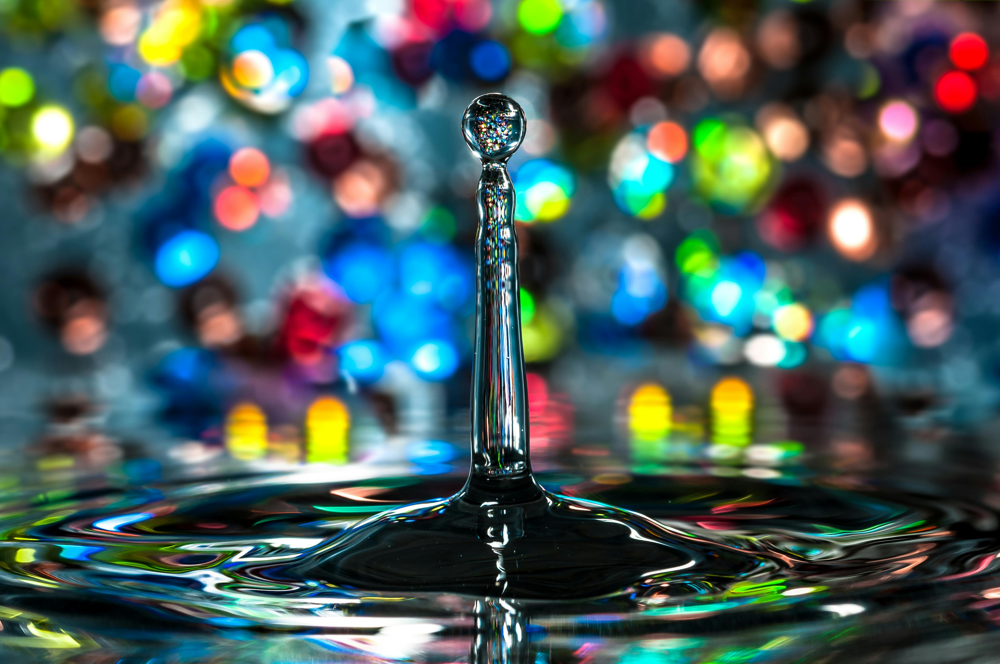

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Predicted Object : bubble


In [5]:
import tensorflow as tf
from tensorflow.keras.applications.mobilenet_v2 import (
    MobileNetV2,
    preprocess_input,
    decode_predictions
)
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.optimizers import Adam
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# 1. Load MobileNetV2 Pretrained on ImageNet
model = MobileNetV2(weights='imagenet')
# Compile with Adam optimizer
model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)
# 2. User Input: External Image Path
img_path = input("Enter the path to your image file: ")
# Load image
image = cv2.imread('/content/pexels-mario-jr-nicorelli-18137315.jpg')
if image is None:
    print("Error: Could not load image. Please check the file path.")
else:
    # 3. Display the uploaded image
    cv2_imshow(image)
    # Convert BGR → RGB
    img_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # Resize for MobileNetV2 (224 × 224)
    img_rgb = cv2.resize(img_rgb, (224, 224))
    # Convert to array and preprocess
    img_array = img_to_array(img_rgb)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)
    # 4. Predict Top-1 Object Class
    predictions = model.predict(img_array)
    # Decode the prediction
    class_id, class_name, _ = decode_predictions(predictions, top=1)[0][0]
    # 5. Display Result
    print(f"Predicted Object : {class_name}")
